In [1]:
mvt = read.csv("mvt.csv", stringsAsFactor = FALSE)

In [2]:
str(mvt)

'data.frame':	191641 obs. of  3 variables:
 $ Date     : chr  "12/31/12 23:15" "12/31/12 22:00" "12/31/12 22:00" "12/31/12 22:00" ...
 $ Latitude : num  41.8 41.9 42 41.8 41.8 ...
 $ Longitude: num  -87.6 -87.7 -87.8 -87.7 -87.6 ...


In [3]:
mvt$Date = strptime(mvt$Date, format = "%m/%d/%y %H:%M")

In [4]:
mvt$Weekday = weekdays(mvt$Date)

In [5]:
mvt$Hour = mvt$Date$hour

In [6]:
str(mvt)

'data.frame':	191641 obs. of  5 variables:
 $ Date     : POSIXlt, format: "2012-12-31 23:15:00" "2012-12-31 22:00:00" ...
 $ Latitude : num  41.8 41.9 42 41.8 41.8 ...
 $ Longitude: num  -87.6 -87.7 -87.8 -87.7 -87.6 ...
 $ Weekday  : chr  "Monday" "Monday" "Monday" "Monday" ...
 $ Hour     : int  23 22 22 22 21 20 20 20 19 18 ...


In [7]:
table(mvt$Weekday)


   Friday    Monday  Saturday    Sunday  Thursday   Tuesday Wednesday 
    29284     27397     27118     26316     27319     26791     27416 

In [8]:
WeekdayCounts = as.data.frame(table(mvt$Weekday))

In [9]:
str(WeekdayCounts)

'data.frame':	7 obs. of  2 variables:
 $ Var1: Factor w/ 7 levels "Friday","Monday",..: 1 2 3 4 5 6 7
 $ Freq: int  29284 27397 27118 26316 27319 26791 27416


In [10]:
library(ggplot2)

Warning message:
: package ‘ggplot2’ was built under R version 3.3.0

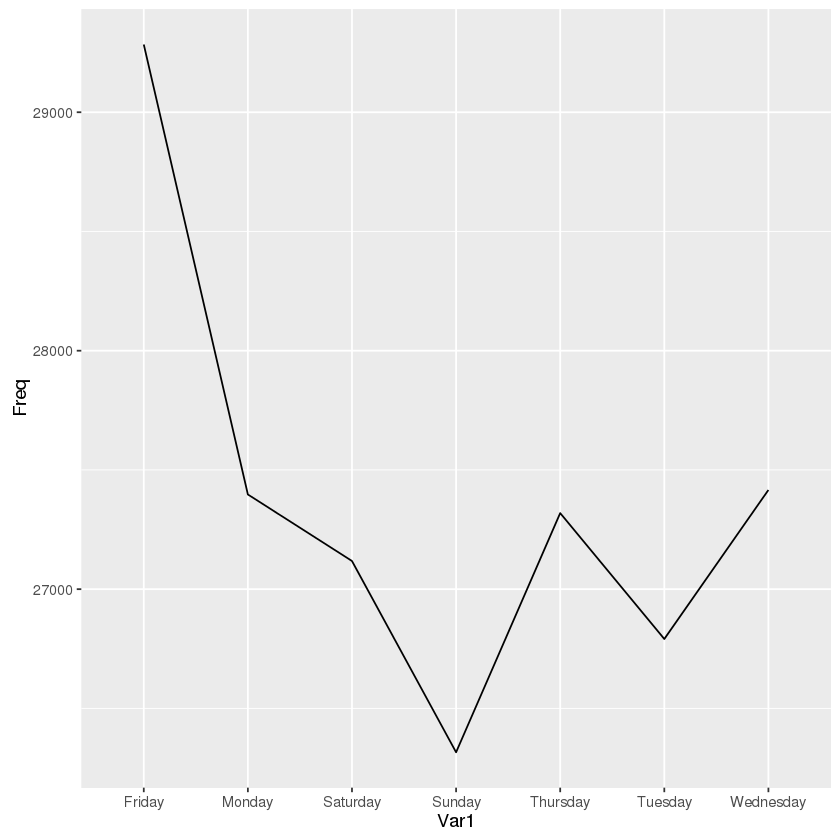

In [11]:
ggplot(WeekdayCounts, aes(x=Var1, y=Freq))+geom_line(aes(group = 1))

In [12]:
WeekdayCounts$Var1 = factor(WeekdayCounts$Var1, ordered = TRUE, levels = c("Sunday","Monday","Tuesday","Wednesday","Thursday","Friday","Saturday"))

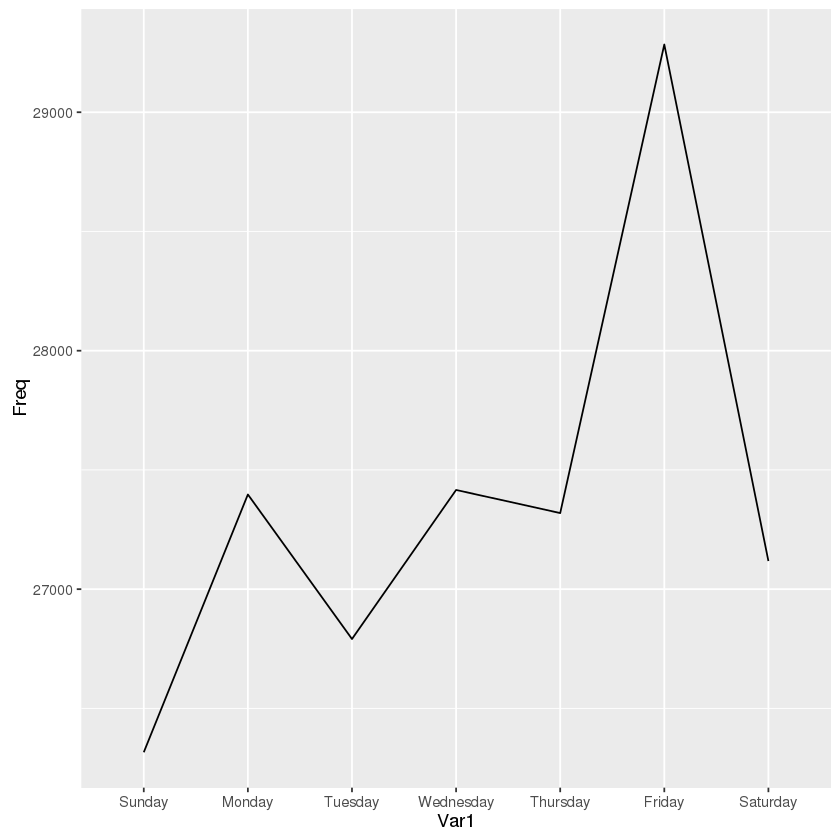

In [13]:
ggplot(WeekdayCounts, aes(x=Var1, y=Freq))+geom_line(aes(group = 1))

In [14]:
# Change x and y labels

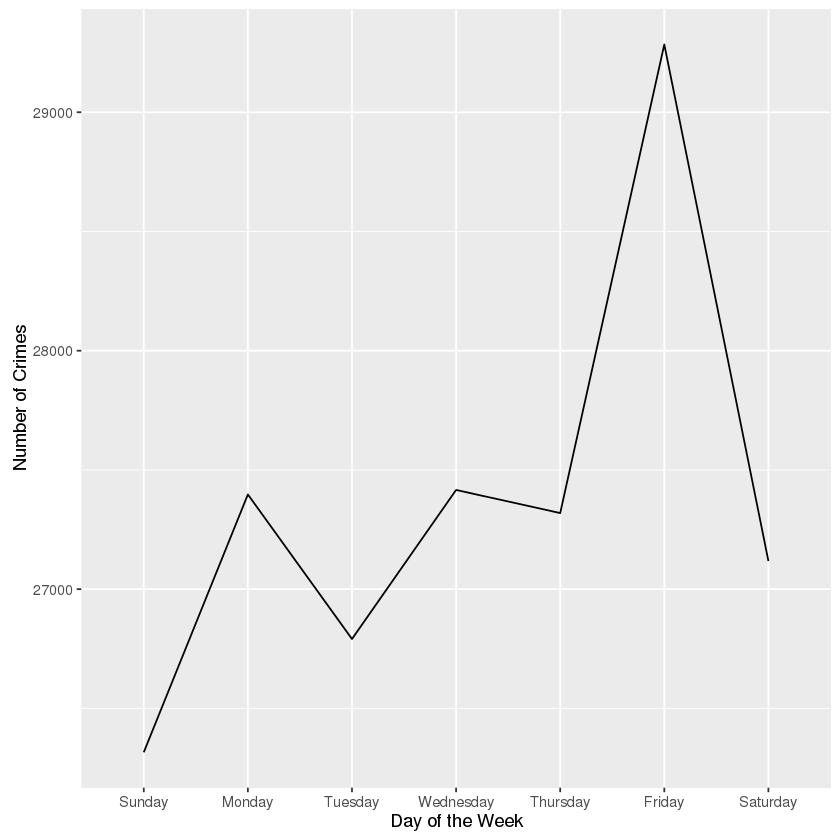

In [15]:
ggplot(WeekdayCounts, aes(x=Var1, y=Freq))+geom_line(aes(group = 1))+xlab("Day of the Week")+ylab("Number of Crimes")

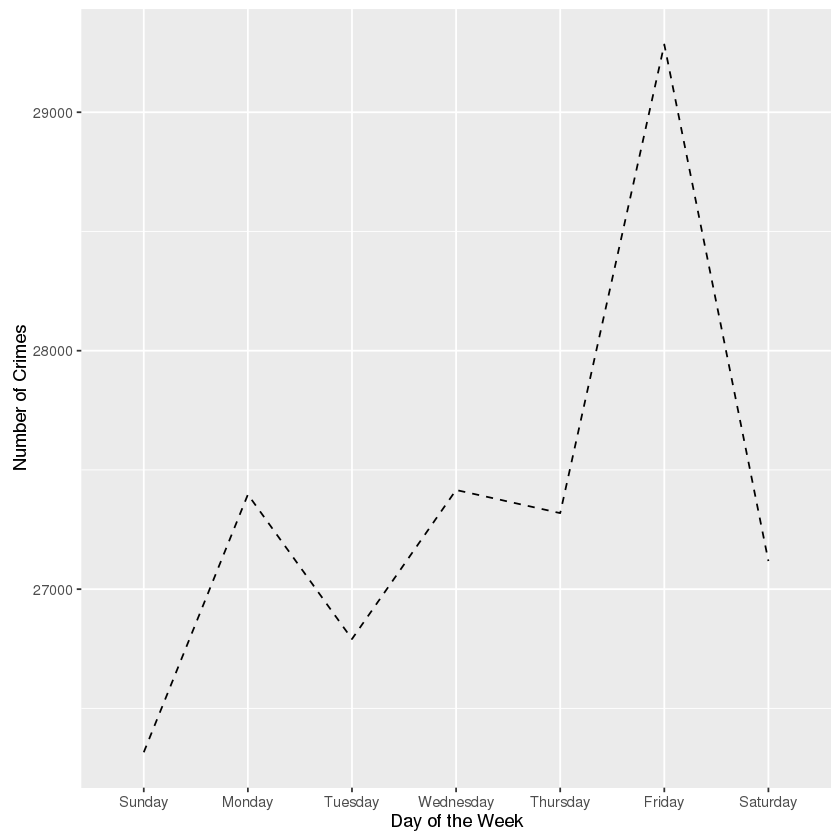

In [16]:
ggplot(WeekdayCounts, aes(x=Var1, y=Freq))+geom_line(aes(group = 1), linetype = 2)+xlab("Day of the Week")+ylab("Number of Crimes")

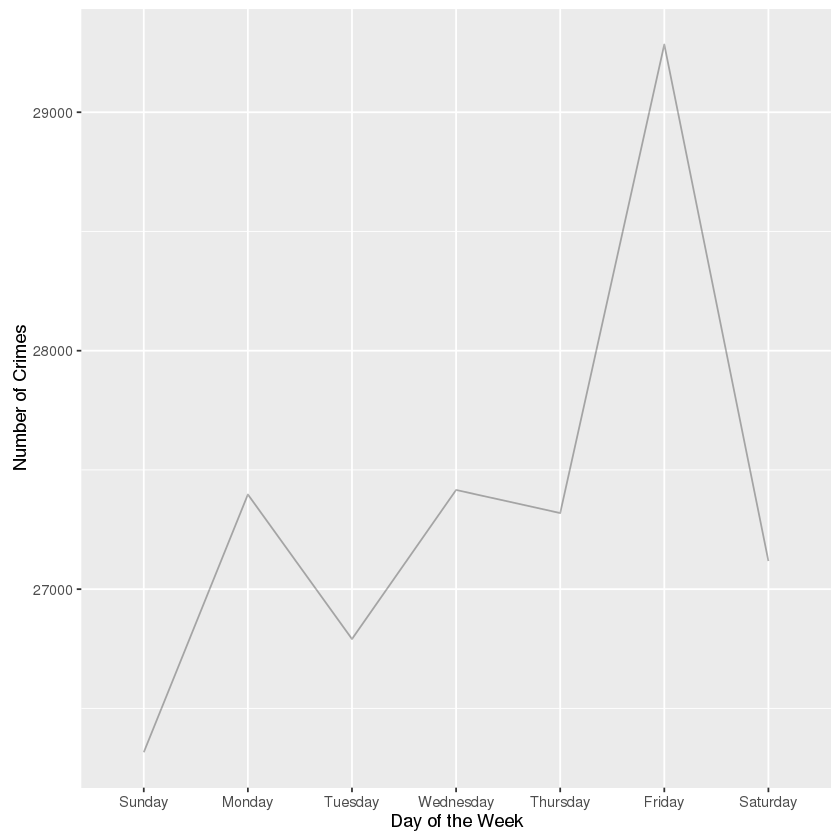

In [17]:
ggplot(WeekdayCounts, aes(x=Var1, y=Freq))+geom_line(aes(group = 1), alpha = 0.3)+xlab("Day of the Week")+ylab("Number of Crimes")

In [18]:
table(mvt$Weekday, mvt$Hour)

           
               0    1    2    3    4    5    6    7    8    9   10   11   12
  Friday    1873  932  743  560  473  602  839 1203 1268 1286  938  822 1207
  Monday    1900  825  712  527  415  542  772 1123 1323 1235  971  737 1129
  Saturday  2050 1267  985  836  652  508  541  650  858 1039  946  789 1204
  Sunday    2028 1236 1019  838  607  461  478  483  615  864  884  787 1192
  Thursday  1856  816  696  508  400  534  799 1135 1298 1301  932  731 1093
  Tuesday   1691  777  603  464  414  520  845 1118 1175 1174  948  786 1108
  Wednesday 1814  790  619  469  396  561  862 1140 1329 1237  947  763 1225
           
              13   14   15   16   17   18   19   20   21   22   23
  Friday     857  937 1140 1165 1318 1623 1652 1736 1881 2308 1921
  Monday     824  958 1059 1136 1252 1518 1503 1622 1815 2009 1490
  Saturday   767  963 1086 1055 1084 1348 1390 1570 1702 2078 1750
  Sunday     789  959 1037 1083 1160 1389 1342 1706 1696 2079 1584
  Thursday   752  831 104

In [19]:
DayHourCounts = as.data.frame(table(mvt$Weekday, mvt$Hour))

In [20]:
str(DayHourCounts)

'data.frame':	168 obs. of  3 variables:
 $ Var1: Factor w/ 7 levels "Friday","Monday",..: 1 2 3 4 5 6 7 1 2 3 ...
 $ Var2: Factor w/ 24 levels "0","1","2","3",..: 1 1 1 1 1 1 1 2 2 2 ...
 $ Freq: int  1873 1900 2050 2028 1856 1691 1814 932 825 1267 ...


In [21]:
DayHourCounts$Hour =as.numeric(as.character(DayHourCounts$Var2))

In [22]:
str(DayHourCounts)

'data.frame':	168 obs. of  4 variables:
 $ Var1: Factor w/ 7 levels "Friday","Monday",..: 1 2 3 4 5 6 7 1 2 3 ...
 $ Var2: Factor w/ 24 levels "0","1","2","3",..: 1 1 1 1 1 1 1 2 2 2 ...
 $ Freq: int  1873 1900 2050 2028 1856 1691 1814 932 825 1267 ...
 $ Hour: num  0 0 0 0 0 0 0 1 1 1 ...


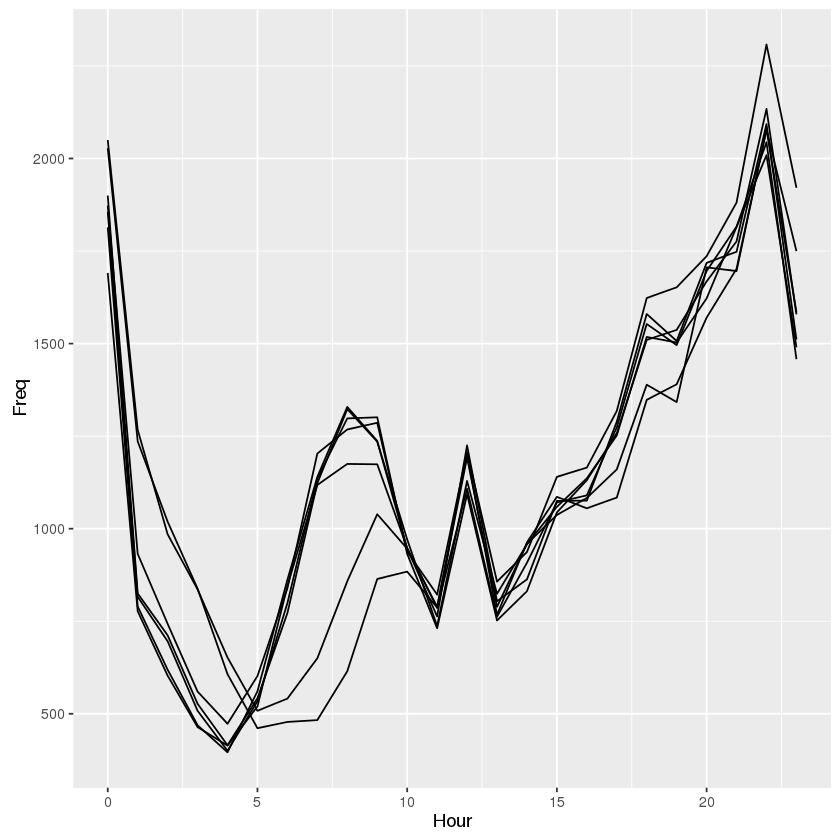

In [23]:
ggplot(DayHourCounts, aes(x=Hour,y=Freq)) + geom_line(aes(group = Var1))

It has seven lines, one for each day of the week.
While this is interesting, we can't
tell which line is which day, so let's change

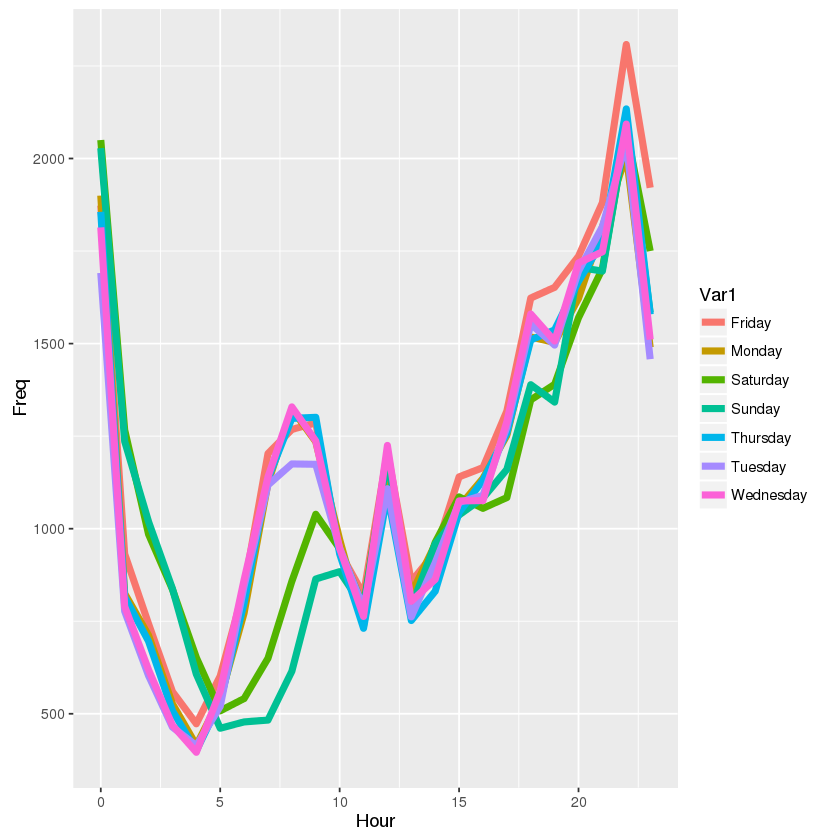

In [24]:
ggplot(DayHourCounts, aes(x=Hour,y=Freq)) + geom_line(aes(group = Var1, color = Var1),size=2)

In [25]:
DayHourCounts$Var1 = factor(DayHourCounts$Var1, ordered = TRUE, levels = c("Monday","Tuesday","Wednesday","Thursday","Friday","Saturday","Sunday"))

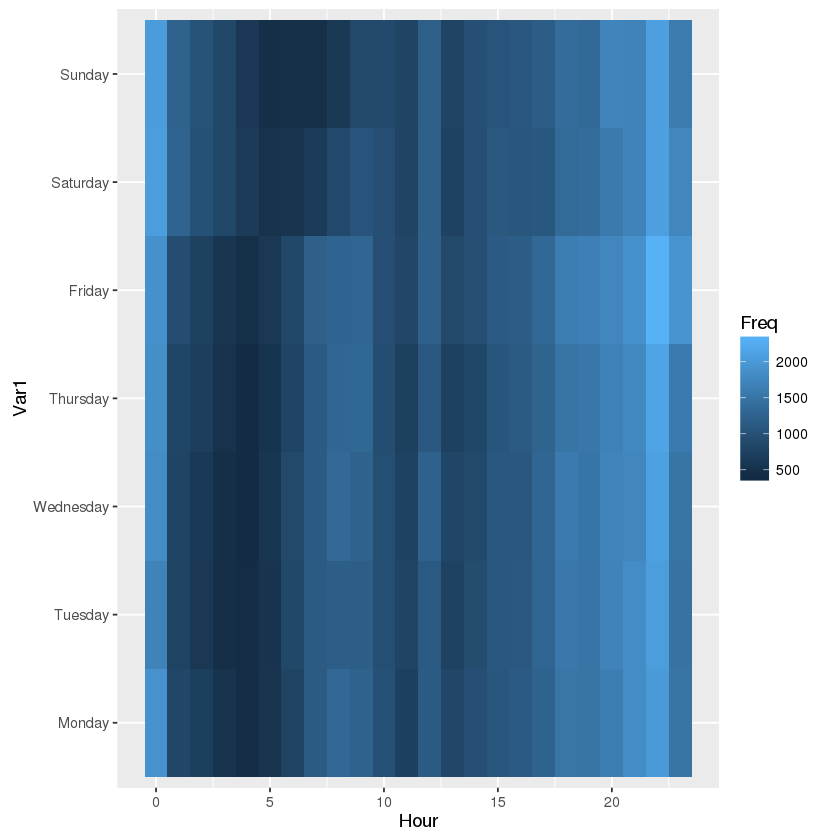

In [26]:
ggplot(DayHourCounts,aes(x = Hour, y = Var1))+geom_tile(aes(fill = Freq))

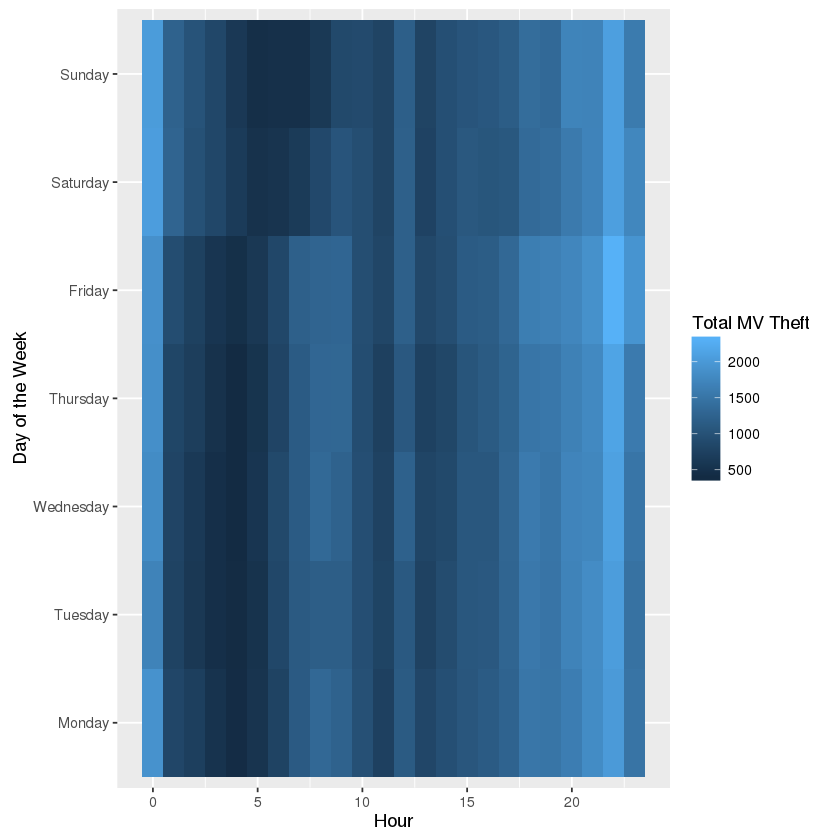

In [27]:
ggplot(DayHourCounts,aes(x = Hour, y = Var1))+geom_tile(aes(fill = Freq))+scale_fill_gradient(name="Total MV Theft")+ ylab("Day of the Week")

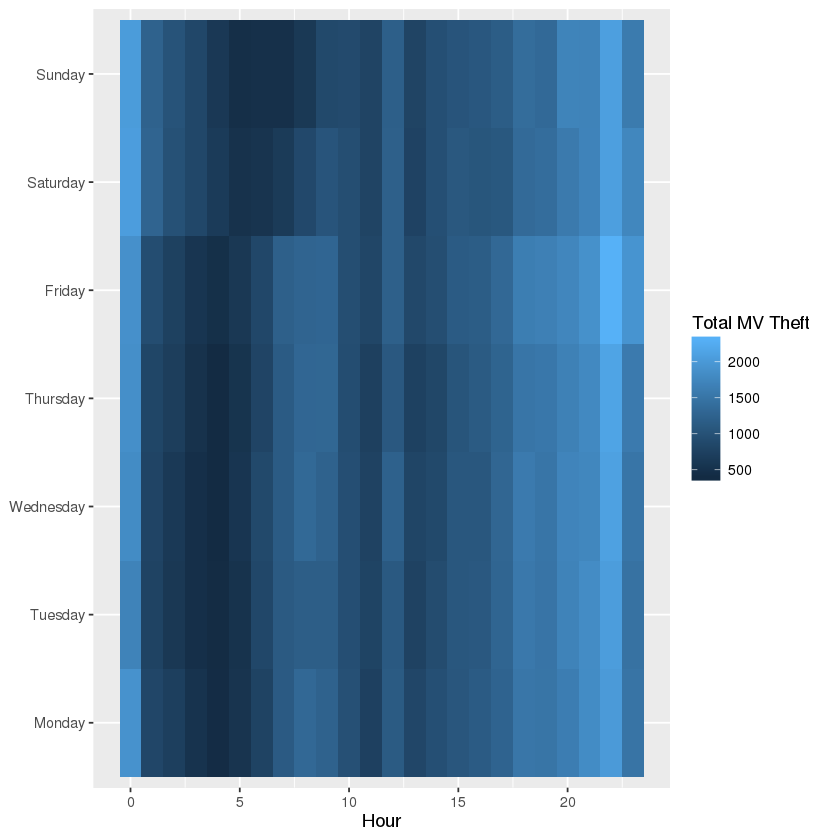

In [28]:
ggplot(DayHourCounts,aes(x = Hour, y = Var1))+geom_tile(aes(fill = Freq))+scale_fill_gradient(name="Total MV Theft")+theme(axis.title.y= element_blank())

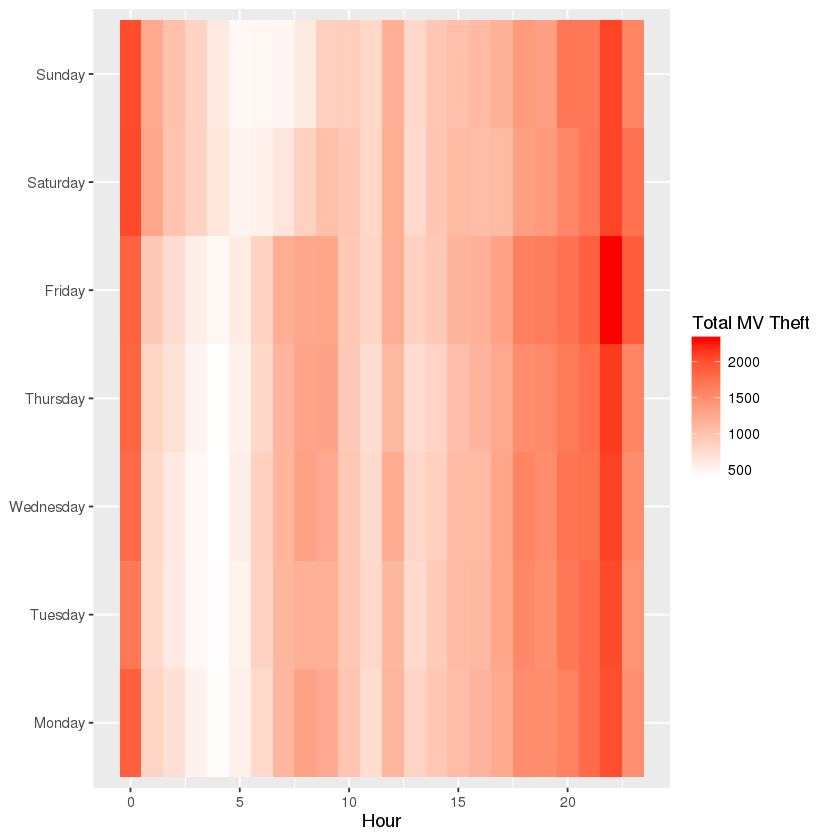

In [29]:
ggplot(DayHourCounts,aes(x = Hour, y = Var1))+geom_tile(aes(fill = Freq))+scale_fill_gradient(name="Total MV Theft",low="white",high="red")+theme(axis.title.y= element_blank())

In [30]:
library(maps)

Warning message:
: package ‘maps’ was built under R version 3.3.0
 # maps v3.1: updated 'world': all lakes moved to separate new #
 # 'lakes' database. Type '?world' or 'news(package="maps")'.  #




In [31]:
library(ggplot2)
library(ggmap)

Warning message:
: package ‘ggmap’ was built under R version 3.3.0

In [32]:
chicago = get_map(location = "chicago",zoom = 11)

Map from URL : http://maps.googleapis.com/maps/api/staticmap?center=chicago&zoom=11&size=640x640&scale=2&maptype=terrain&language=en-EN&sensor=false
Information from URL : http://maps.googleapis.com/maps/api/geocode/json?address=chicago&sensor=false


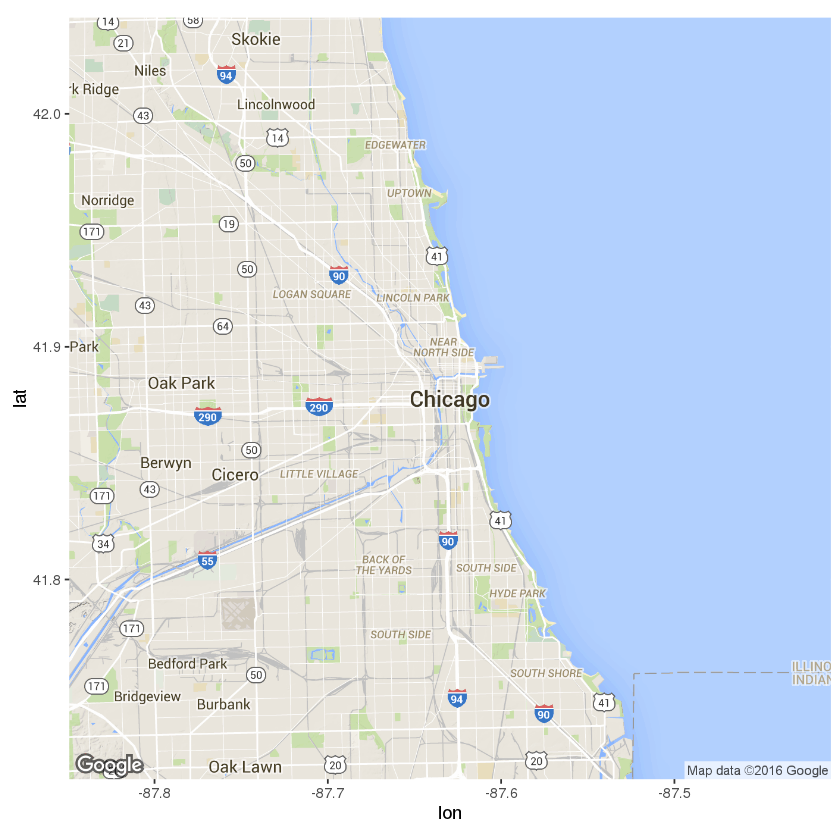

In [33]:
ggmap(chicago)

So we'll call it chicago = get_map(location = "chicago",
zoom = 11).
Let's take a look at the map by using the ggmap function.
Now, in your R graphics window, you
should see a geographical map of the city of Chicago.
Now let's plot the first 100 motor vehicle
thefts in our data set on this map.

Warning message:
: Removed 7 rows containing missing values (geom_point).

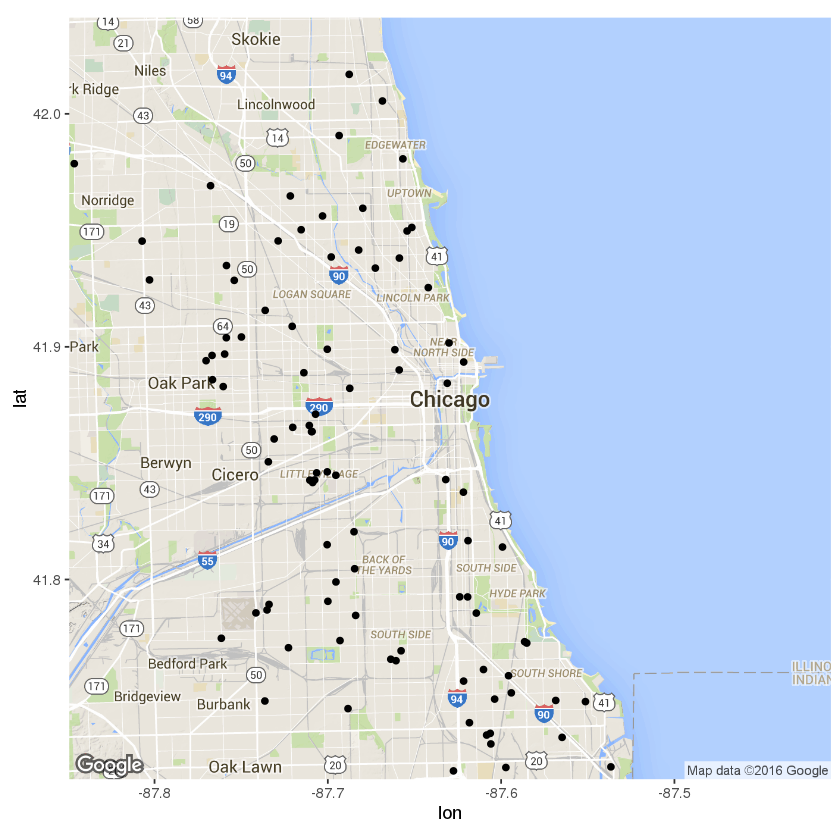

In [36]:
ggmap(chicago)+geom_point(data= mvt[1:100,], aes(x = Longitude, y= Latitude))

If we plotted all 190,000 motor vehicle thefts,
we would just see a big black box,
which wouldn't be helpful at all.
We're more interested in whether or not
an area has a high amount of crime,
so let's round our latitude and longitude
to two digits of accuracy and create a crime counts data
frame for each area.
We'll call it LatLonCounts, and use the as.data.frame function
run on the table that compares the latitude and longitude
rounded to two digits of accuracy.
So our first argument to table is round(mvt$Longitude, 2).
And our second argument is round(mvt$Latitude, 2).
This gives us the total crimes at every point on a grid.


In [39]:
LatLonCounts = as.data.frame(table(round(mvt$Longitude,2), round(mvt$Latitude,2)))

In [40]:
str(LatLonCounts)

'data.frame':	1638 obs. of  3 variables:
 $ Var1: Factor w/ 42 levels "-87.93","-87.92",..: 1 2 3 4 5 6 7 8 9 10 ...
 $ Var2: Factor w/ 39 levels "41.64","41.65",..: 1 1 1 1 1 1 1 1 1 1 ...
 $ Freq: int  0 0 0 0 0 0 0 0 0 0 ...


In [41]:
LatLonCounts$Long = as.numeric(as.character(LatLonCounts$Var1))
LatLonCounts$Lat = as.numeric(as.character(LatLonCounts$Var2))

Warning message:
: Removed 615 rows containing missing values (geom_point).

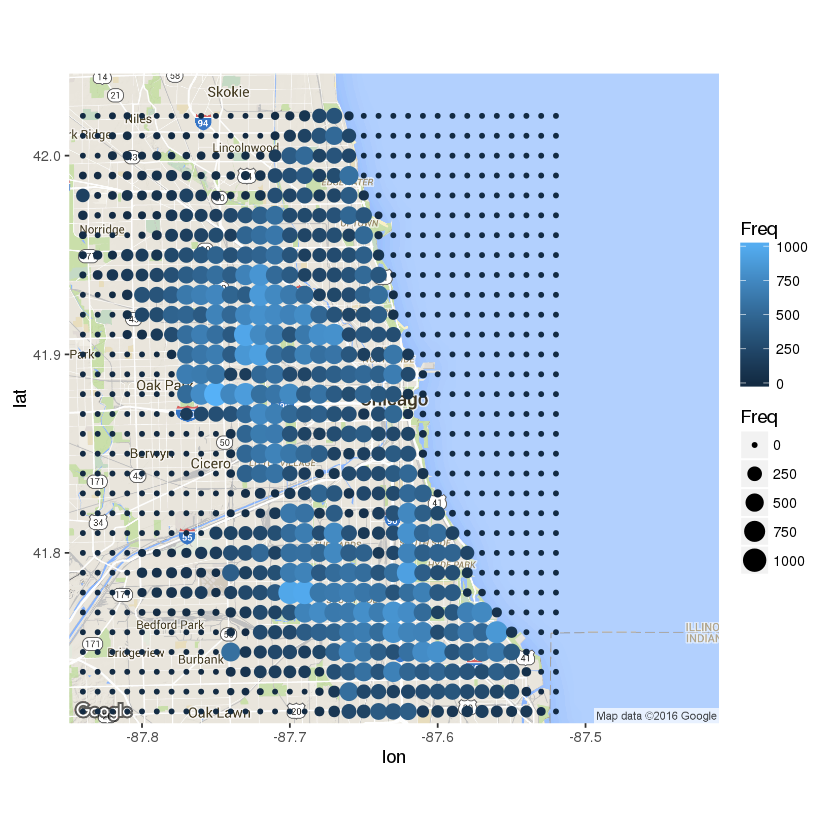

In [43]:
ggmap(chicago)+geom_point(data = LatLonCounts, aes(x=Long, y= Lat,color=Freq,size=Freq))

Warning message:
: Removed 615 rows containing missing values (geom_point).

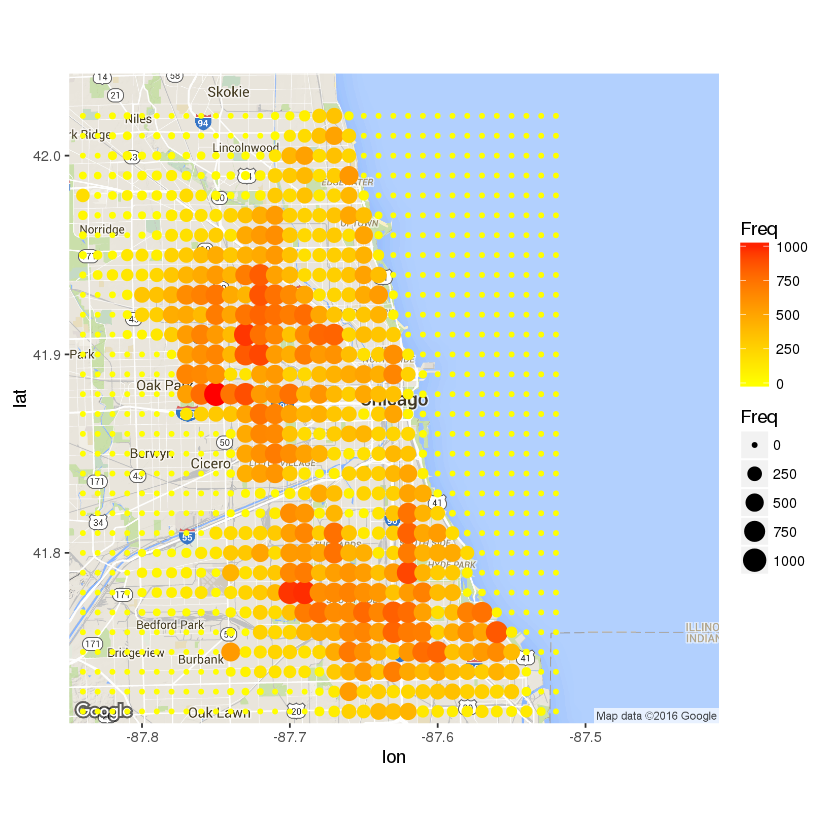

In [44]:
ggmap(chicago)+geom_point(data = LatLonCounts, aes(x=Long, y= Lat,color=Freq,size=Freq))+scale_color_gradient(low = "yellow", high = "red")

Warning message:
: Removed 615 rows containing missing values (geom_tile).

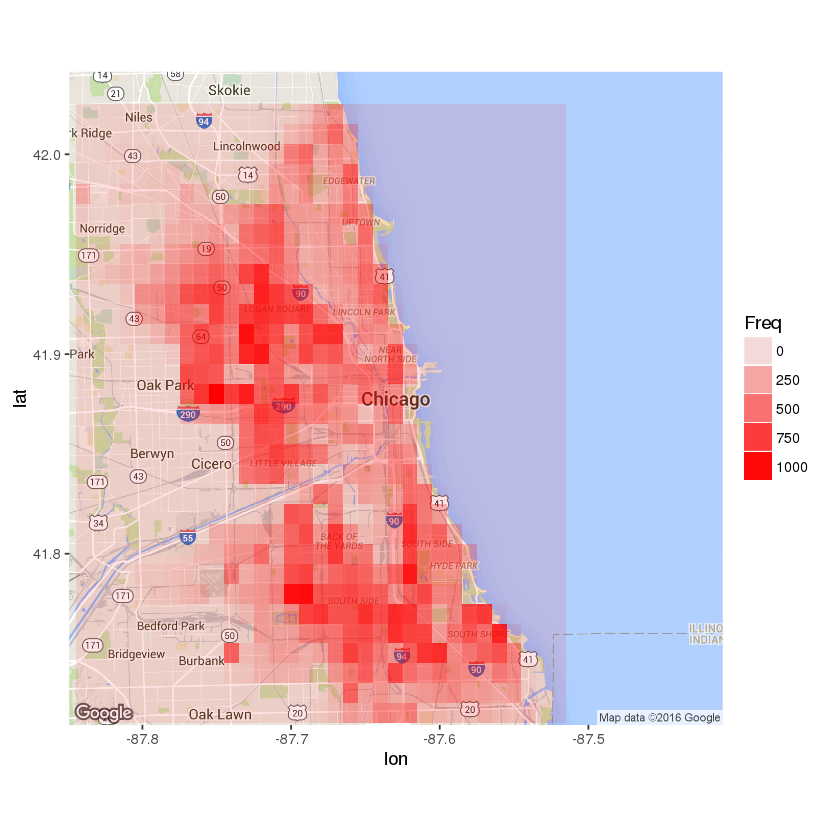

In [50]:
ggmap(chicago)+geom_tile(data = LatLonCounts, 
                          aes(x=Long, y= Lat,alpha=Freq), fill = "red")

In [51]:
LatLonCounts2 = subset(LatLonCounts, Freq >0)

In [53]:
nrow(LatLonCounts)-nrow(LatLonCounts2)

[1] 952

Warning message:
: Removed 119 rows containing missing values (geom_tile).

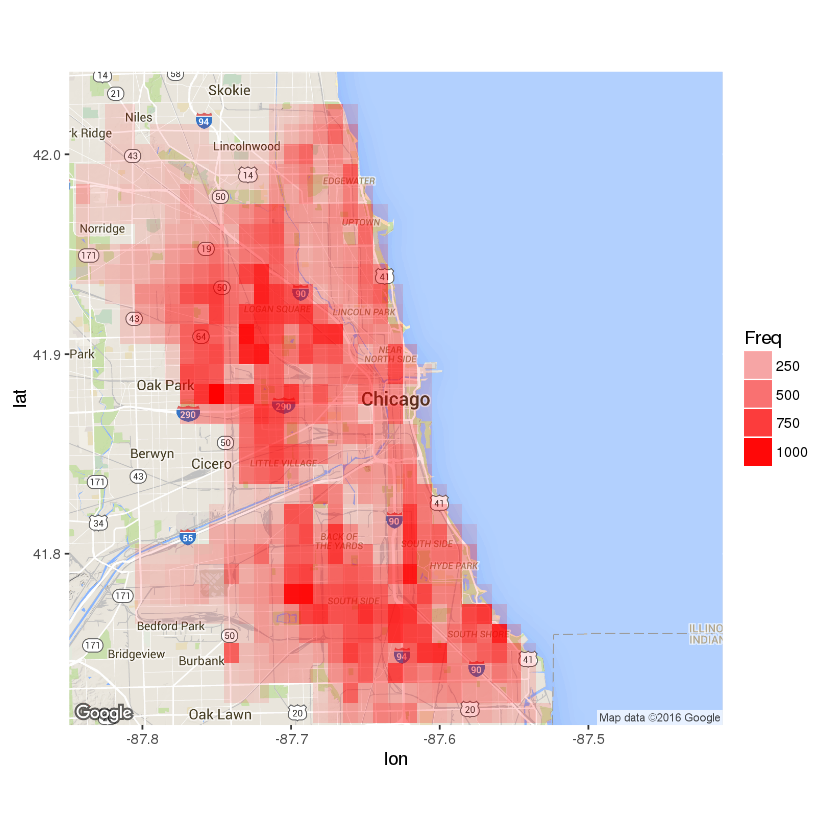

In [54]:
ggmap(chicago)+geom_tile(data = LatLonCounts2, 
                          aes(x=Long, y= Lat,alpha=Freq), fill = "red")

In [55]:
murders = read.csv("murders.csv")

In [56]:
str(murders)

'data.frame':	51 obs. of  6 variables:
 $ State            : Factor w/ 51 levels "Alabama","Alaska",..: 1 2 3 4 5 6 7 8 9 10 ...
 $ Population       : int  4779736 710231 6392017 2915918 37253956 5029196 3574097 897934 601723 19687653 ...
 $ PopulationDensity: num  94.65 1.26 57.05 56.43 244.2 ...
 $ Murders          : int  199 31 352 130 1811 117 131 48 131 987 ...
 $ GunMurders       : int  135 19 232 93 1257 65 97 38 99 669 ...
 $ GunOwnership     : num  0.517 0.578 0.311 0.553 0.213 0.347 0.167 0.255 0.036 0.245 ...


In [58]:
statesMap = map_data("state")

In [60]:
str(statesMap)

'data.frame':	15537 obs. of  6 variables:
 $ long     : num  -87.5 -87.5 -87.5 -87.5 -87.6 ...
 $ lat      : num  30.4 30.4 30.4 30.3 30.3 ...
 $ group    : num  1 1 1 1 1 1 1 1 1 1 ...
 $ order    : int  1 2 3 4 5 6 7 8 9 10 ...
 $ region   : chr  "alabama" "alabama" "alabama" "alabama" ...
 $ subregion: chr  NA NA NA NA ...


So type ggplot, and then in parentheses, our data frame
is statesMap, and then our aesthetic is x = long,
the longitude variable in statesMap, y = lat,
the latitude variable, and then group = group.
This is the variable defining how
to draw the United States into groups by state.
Then close both parentheses here,
and we'll add geom_polygon where our arguments here will be
fill="white"-- we'll just fill all states in white--
and color="black" to outline the states in black.


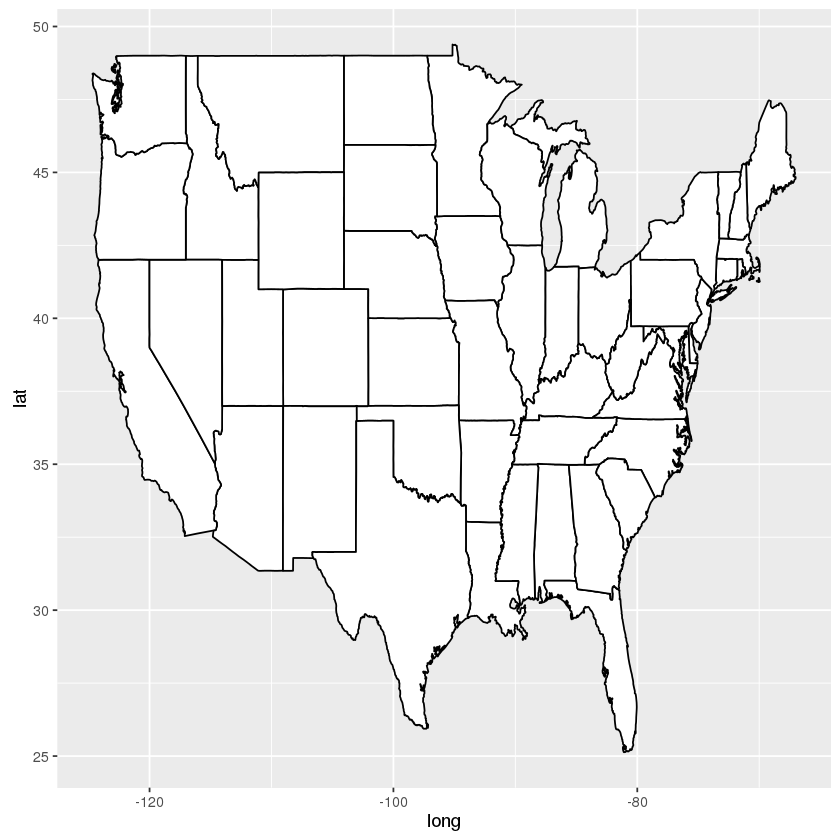

In [62]:
ggplot(statesMap, aes(x=long,y=lat,group=group))+geom_polygon(fill="white",color = "black")

In the murders data frame, our state names
are in the State variable, and they
start with a capital letter.
But in the statesMap data frame, our state names
are in the region variable, and they're all lowercase.
So let's create a new variable called region in our murders
data frame to match the state name variable in the statesMap

In [63]:
murders$region = tolower(murders$State)

Now we can join the statesMap data frame with the murders
data frame by using the merge function, which
matches rows of a data frame based on a shared identifier.
We just defined the variable region,
which exists in both data frames.
So we'll call our new data frame murderMap,
and we'll use the merge function,
where the first argument is our first data frame, statesMap,
the second argument is our second data frame, murders,
and the third argument is by="region".
This is the identifier to use to merge the rows.
Let's take a look at the data frame
we just created using the str function.
We have the same number of observations
here that we had in the statesMap data frame,
but now we have both the variables from the statesMap
data frame and the variables from the murders data
frame, which were matched up based on the region variable.
So now, let's plot the number of murders
on our map of the United States.


In [64]:
murderMap = merge(murders,statesMap, by="region")

In [65]:
str(murderMap)

'data.frame':	15537 obs. of  12 variables:
 $ region           : chr  "alabama" "alabama" "alabama" "alabama" ...
 $ State            : Factor w/ 51 levels "Alabama","Alaska",..: 1 1 1 1 1 1 1 1 1 1 ...
 $ Population       : int  4779736 4779736 4779736 4779736 4779736 4779736 4779736 4779736 4779736 4779736 ...
 $ PopulationDensity: num  94.7 94.7 94.7 94.7 94.7 ...
 $ Murders          : int  199 199 199 199 199 199 199 199 199 199 ...
 $ GunMurders       : int  135 135 135 135 135 135 135 135 135 135 ...
 $ GunOwnership     : num  0.517 0.517 0.517 0.517 0.517 0.517 0.517 0.517 0.517 0.517 ...
 $ long             : num  -87.5 -87.5 -87.5 -87.5 -87.6 ...
 $ lat              : num  30.4 30.4 30.4 30.3 30.3 ...
 $ group            : num  1 1 1 1 1 1 1 1 1 1 ...
 $ order            : int  1 2 3 4 5 6 7 8 9 10 ...
 $ subregion        : chr  NA NA NA NA ...


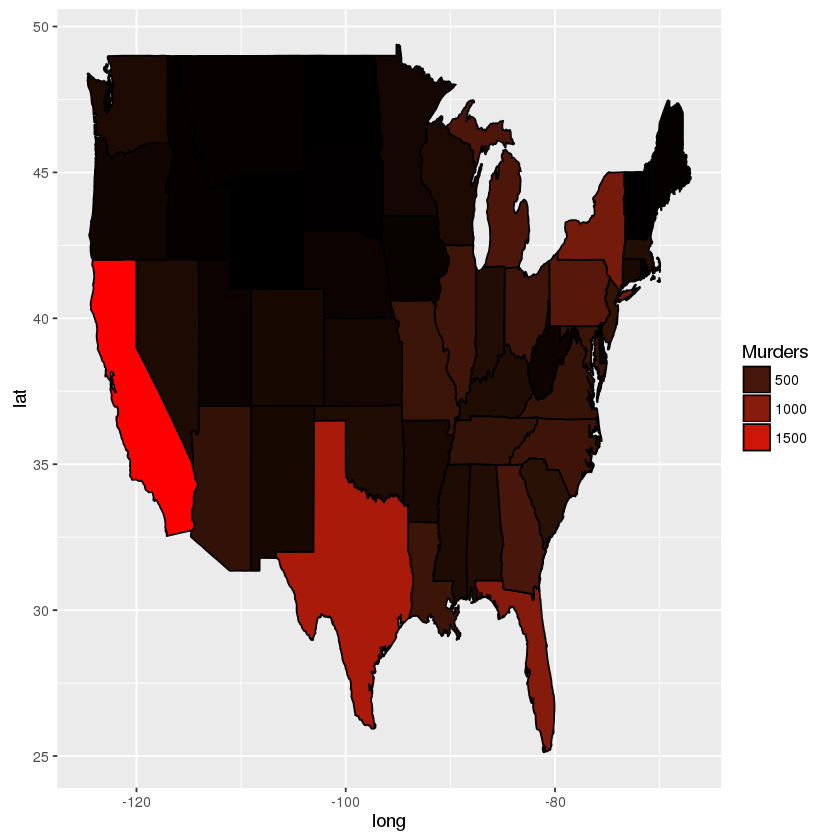

In [67]:
ggplot(murderMap, aes(x=long,y=lat,group=group, 
                      fill = Murders))+geom_polygon(color = "black")+scale_fill_gradient(low="black",
                                                                                         high="red",
                                                                                        guide = "legend")


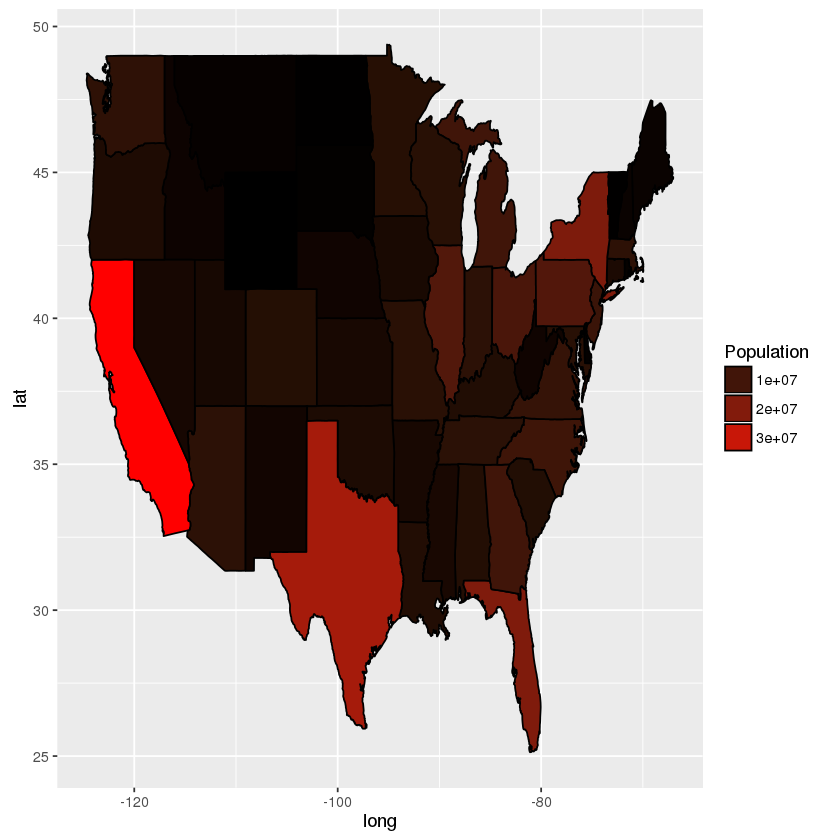

In [68]:
ggplot(murderMap, aes(x=long,y=lat,group=group, 
                      fill = Population))+geom_polygon(color = "black")+scale_fill_gradient(low="black",
                                                                                         high="red",
                                                                                        guide = "legend")


If you look at the graphics window,
we have a population map here which
looks exactly the same as our murders map.
So we need to plot the murder rate instead
of the number of murders to make sure we're not just
plotting a population map.
So in our R Console, let's create
a new variable for the murder rate.
So in our murderMap data frame, we'll create the MurderRate
variable, which is equal to murderMap$Murders--
the number of murders-- divided by murderMap$Population times
100,000.


In [69]:
murderMap$MurderRate = murderMap$Murders/murderMap$Population*100000

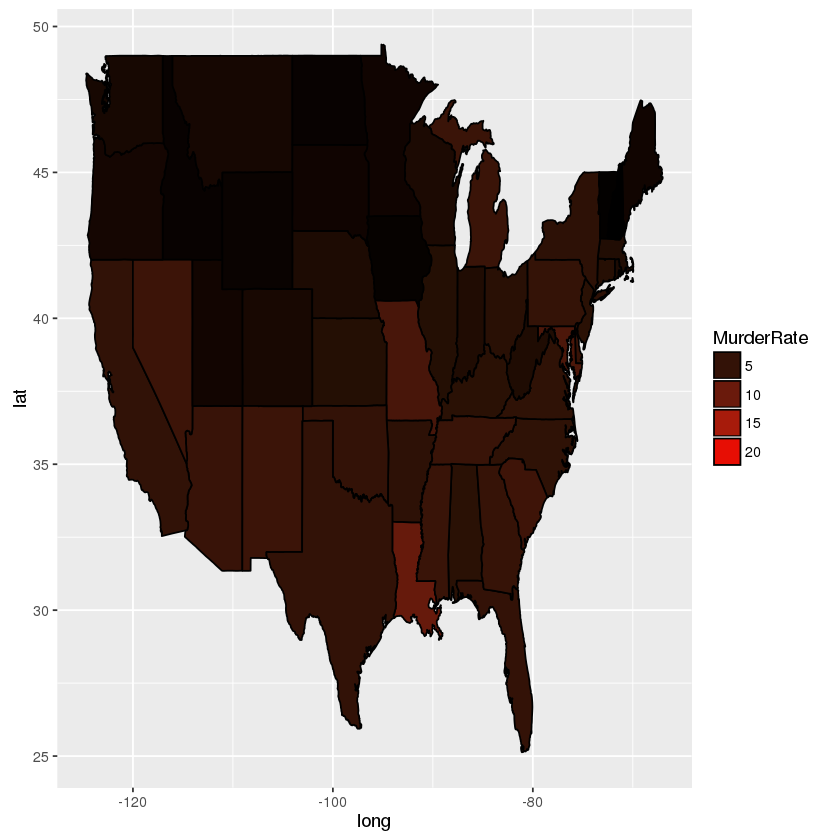

In [70]:
ggplot(murderMap, aes(x=long,y=lat,group=group, 
                      fill = MurderRate))+geom_polygon(color = "black")+scale_fill_gradient(low="black",
                                                                                         high="red",
                                                                                        guide = "legend")

f you look at your graphics window now,
you should see that the plot is surprisingly maroon-looking.
There aren't really any red states.
Why?
It turns out that Washington, DC is
an outlier with a very high murder rate,
but it's such a small region on the map
that we can't even see it.
So let's redo our plot, removing any observations
with murder rates above 10, which
we know will only exclude Washington, DC.
Keep in mind that when interpreting and explaining
the resulting plot, you should always
note what you did to create it: removed
Washington, DC from the data.
So in your R Console, hit the Up arrow again, and this time,
after guide="legend", we'll type limits=c(0,10) and hit Enter.
Now if you look back at your graphics window,
you can see a range of colors on the map.


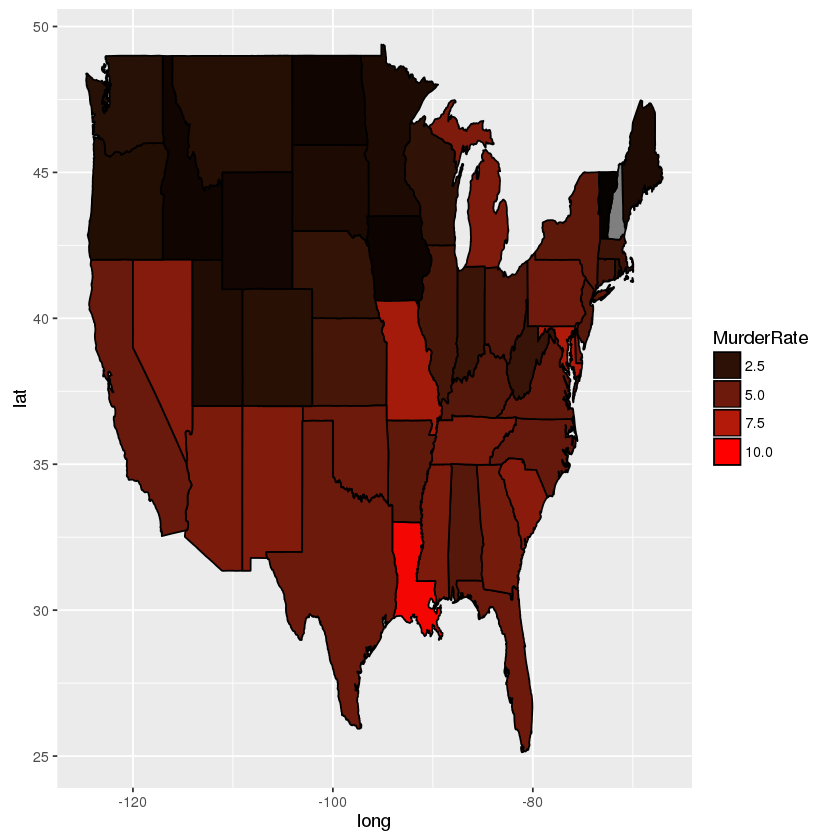

In [72]:
ggplot(murderMap, aes(x=long,y=lat,group=group, fill = MurderRate))+
       geom_polygon(color = "black")+
        scale_fill_gradient(low="black",high="red",  guide = "legend", limit = c(1,10))

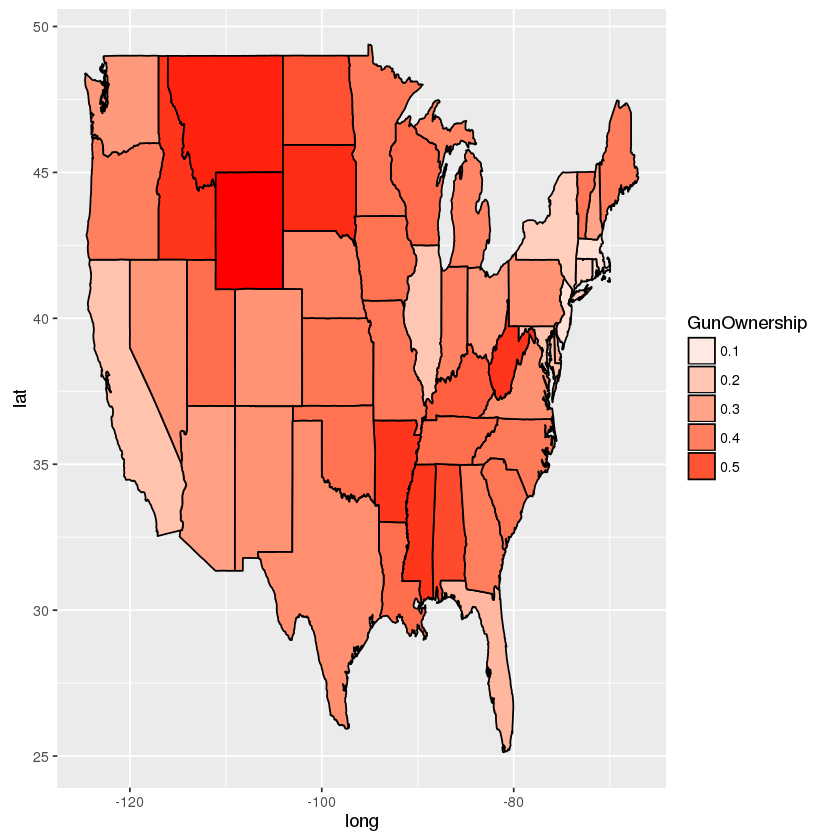

In [73]:
ggplot(murderMap, aes(x=long,y=lat,group=group, 
                      fill = GunOwnership))+geom_polygon(color = "black")+scale_fill_gradient(low="white",
                                                                                         high="red",
                                                                                        guide = "legend")